In [71]:
import os
import time
import csv

import pandas as pd
import numpy as np

from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, ConfusionMatrixDisplay
from sklearn.model_selection import RandomizedSearchCV, train_test_split, GridSearchCV
from scipy.stats import randint

import matplotlib.pyplot as plt

In [72]:
base_path = "lend-or-lose"
train_path = os.path.join(base_path, "train.csv")
test_path = os.path.join(base_path, "test.csv")

In [73]:
train_csv = pd.read_csv(train_path)
test_csv = pd.read_csv(test_path)

In [74]:
test_csv.head()

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner
0,CKV34LU7V7,55,112656,92393,581,113,2,23.54,36,0.15,PhD,Self-employed,Single,Yes,Yes,Home,No
1,62KTYNH93J,56,91569,131575,641,54,1,15.19,12,0.43,High School,Part-time,Divorced,Yes,Yes,Education,Yes
2,JGFUSOIUH7,26,78169,75417,569,105,3,18.02,12,0.29,Master's,Part-time,Married,Yes,Yes,Education,Yes
3,4538THBHOX,26,63033,10804,326,118,1,14.71,24,0.41,High School,Part-time,Single,No,No,Business,Yes
4,DXLNA06JHR,24,29665,21182,662,102,3,15.02,60,0.69,PhD,Unemployed,Single,No,Yes,Business,Yes


**Dataset Columns to Categorical**

In [75]:
df_education_map = ['High School', "Master's", "Bachelor's", 'PhD']
df_employment_type_map = ['Self-employed', 'Unemployed', 'Part-time', 'Full-time']
df_marital_status_map = ['Single', 'Divorced', 'Married']
df_has_mort_map = ['Yes', 'No']
df_has_depends_map = ['No', 'Yes']
df_loan_purpose_map = ['Business', 'Education', 'Other', 'Auto', 'Home']
df_has_co_map = ['No', 'Yes']
arr_one_hot = {"Education": df_education_map, "EmploymentType": df_employment_type_map, "MaritalStatus": df_marital_status_map,
               "HasMortgage": df_has_mort_map, "HasDependents": df_has_depends_map, "LoanPurpose": df_loan_purpose_map,
               "HasCoSigner": df_has_co_map}

In [76]:
for text_col in arr_one_hot:
    train_csv = train_csv.replace({text_col: {key_temp: val_temp for val_temp, key_temp in enumerate(arr_one_hot[text_col])}})

/var/folders/3x/956gglvx6tbcvyg7m0dghx8r0000gq/T/ipykernel_11291/1099552776.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  train_csv = train_csv.replace({text_col: {key_temp: val_temp for val_temp, key_temp in enumerate(arr_one_hot[text_col])}})


In [77]:
for text_col in arr_one_hot:
    test_csv = test_csv.replace({text_col: {key_temp: val_temp for val_temp, key_temp in enumerate(arr_one_hot[text_col])}})

/var/folders/3x/956gglvx6tbcvyg7m0dghx8r0000gq/T/ipykernel_11291/569696182.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  test_csv = test_csv.replace({text_col: {key_temp: val_temp for val_temp, key_temp in enumerate(arr_one_hot[text_col])}})


In [78]:
for row_index in range(train_csv.shape[0]):
    train_csv.iloc[row_index, 8] = int(train_csv.iloc[row_index, 8] / 12)

In [80]:
for row_index in range(test_csv.shape[0]):
    test_csv.iloc[row_index, 8] = int(test_csv.iloc[row_index, 8] / 12)

In [81]:
train_csv.head()

,LoanID,Age,Income,LoanAmount,CreditScore,MonthsEmployed,NumCreditLines,InterestRate,LoanTerm,DTIRatio,Education,EmploymentType,MaritalStatus,HasMortgage,HasDependents,LoanPurpose,HasCoSigner,Default
0,DRIRC89L0T,18,137576,209136,846,26,2,10.47,5,0.81,0,0,0,0,0,0,0,0
1,TS0FIUNHNU,47,57194,5970,748,30,2,19.72,3,0.73,0,1,1,1,1,1,0,0
2,I0YR284A1V,26,84328,95065,453,7,2,24.25,1,0.45,1,0,2,1,0,2,1,0
3,WB1T7NQV8A,53,49795,229582,533,107,3,14.44,5,0.17,2,0,0,0,0,3,1,1
4,J6GU9M4G1Z,49,115450,22072,840,0,4,24.48,1,0.11,2,2,0,1,1,1,1,0


**Adding new column in the DataFrame**

In [82]:
train_csv['AmountRatio_I_La'] = [train_csv.iloc[i, 2]/train_csv.iloc[i, 3] for i in range(train_csv.shape[0])]

In [83]:
test_csv['AmountRatio_I_La'] = [test_csv.iloc[i, 2]/test_csv.iloc[i, 3] for i in range(test_csv.shape[0])]

**Making feature arrays for different configurations**

In [84]:
X_feats_A = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
              'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio', 'Education',
              'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents',
              'LoanPurpose', 'HasCoSigner']

X_feats_B = ['Age', 'Income', 'CreditScore', 'MonthsEmployed',
              'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio', 'Education',
              'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents',
              'LoanPurpose', 'HasCoSigner', 'AmountRatio_I_La']

X_feats_C = ['Age', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
              'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio', 'Education',
              'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents',
              'LoanPurpose', 'HasCoSigner', 'AmountRatio_I_La']

X_feats_D = ['Age', 'CreditScore', 'MonthsEmployed',
              'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio', 'Education',
              'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents',
              'LoanPurpose', 'HasCoSigner', 'AmountRatio_I_La']

X_feats_E = ['Age', 'Income', 'LoanAmount', 'CreditScore', 'MonthsEmployed',
              'NumCreditLines', 'InterestRate', 'LoanTerm', 'DTIRatio', 'Education',
              'EmploymentType', 'MaritalStatus', 'HasMortgage', 'HasDependents',
              'LoanPurpose', 'HasCoSigner', 'AmountRatio_I_La']

In [85]:
y_feats = ['Default']

**Main variable setting**

In [86]:
X_A, X_B, X_C, X_D, X_E = train_csv[X_feats_A], train_csv[X_feats_B], train_csv[X_feats_C], train_csv[X_feats_D], train_csv[X_feats_E]
y = train_csv[y_feats]

In [87]:
X_train_A, X_test_A, y_train_A, y_test_A = train_test_split(X_A, y, test_size=0.2, random_state=7)
X_train_B, X_test_B, y_train_B, y_test_B = train_test_split(X_B, y, test_size=0.2, random_state=7)
X_train_C, X_test_C, y_train_C, y_test_C = train_test_split(X_C, y, test_size=0.2, random_state=7)
X_train_D, X_test_D, y_train_D, y_test_D = train_test_split(X_D, y, test_size=0.2, random_state=7)
X_train_E, X_test_E, y_train_E, y_test_E = train_test_split(X_E, y, test_size=0.2, random_state=7)

In [88]:
test_A = test_csv.copy()
del test_A['AmountRatio_I_La']

test_B = test_csv.copy()
del test_B['LoanAmount']

test_C = test_csv.copy()
del test_C['Income']

test_D = test_csv.copy()
del test_D['LoanAmount']
del test_D['Income']

test_E = test_csv.copy()

**Model Training for DecisionTreeClassifier**

In [ ]:
dtree = DecisionTreeClassifier(random_state=49)
rf = RandomForestClassifier(random_state=49)

param_grid = {
    'max_depth': [None, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50],
    'min_samples_split': [2, 5, 10, 15, 20, 25, 30],
    'min_samples_leaf': [1, 2, 4, 8, 16],
    'max_features': [None, 'sqrt', 'log2']
}

grid_search = GridSearchCV(estimator=dtree, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')
random_search = RandomizedSearchCV(estimator=dtree, param_distributions=param_grid, n_iter=20, cv=5, n_jobs=-1,
                                   verbose=2, random_state=7, scoring='accuracy')

DTC Case A

In [139]:
time_DTC_start_A = time.time()
grid_search.fit(X_test_A, y_test_A)
time_DTC_end_A = time.time()

print("time taken to fit for condition A using GridSearch:", time_DTC_end_A - time_DTC_start_A)

Fitting 5 folds for each of 1155 candidates, totalling 5775 fits


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  24.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  25.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  25.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  25.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  25.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  22.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.9s[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.9s

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  10.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  10.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  10.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  10.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  10.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  10.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  10.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  13.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  13.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  13.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  13.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  13.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  12.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  12.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   4.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   4.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  19.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  20.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  20.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   5.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   5.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   5.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  26.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  25.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  27.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  25.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  23.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  29.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  29.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


time taken to fit for condition A using GridSearch: 10133.685864210129


In [140]:
time_DTC_start_A = time.time()
random_search.fit(X_test_A, y_test_A)
time_DTC_end_A = time.time()

print("time taken to fit for condition A using RandomSearchCV:", time_DTC_end_A - time_DTC_start_A)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV

In [141]:
# Best parameters and estimator
print("Best Parameters from GridSearchCV:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred_grid = best_tree.predict(X_test_A)

# Calculate accuracy
accuracy = accuracy_score(y_test_A, y_pred_grid)
print(f"Tuned Decision Tree Accuracy: {accuracy:.2f}")

Best Parameters from GridSearchCV: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 10}
Tuned Decision Tree Accuracy: 0.93


In [142]:
# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_A)
accuracy_random = accuracy_score(y_test_A, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

Best Parameters from RandomizedSearchCV: {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 5}
RandomizedSearchCV Accuracy: 0.89


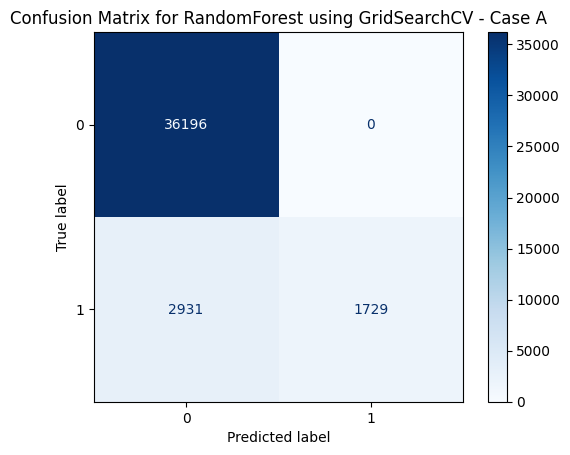

In [ ]:
cm = confusion_matrix(y_test_A, y_pred_grid)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTree using GridSearchCV - Case A")
plt.show()

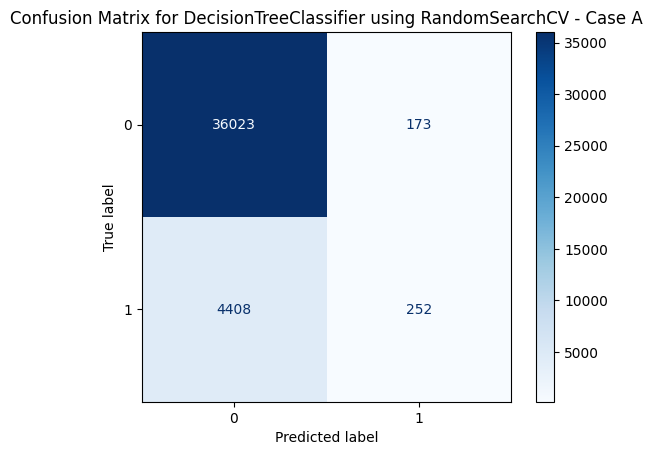

In [144]:
cm = confusion_matrix(y_test_A, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTreeClassifier using RandomSearchCV - Case A")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_A.shape[0]):
   temp_pred = best_tree.predict(test_A.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_A.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_A_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_A_GridSearchCV.csv


In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_A.shape[0]):
   temp_pred = best_random.predict(test_A.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_A.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_A_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_A_RandomSearchCV.csv


DTC Case B

In [147]:
time_DTC_start_B = time.time()
grid_search.fit(X_test_B, y_test_B)
time_DTC_end_B = time.time()

print("time taken to fit for condition B:", time_DTC_end_B - time_DTC_start_B)

Fitting 5 folds for each of 1155 candidates, totalling 5775 fits


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  11.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  11.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  11.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  11.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  10.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  11.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  11.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   4.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  22.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  22.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  22.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  22.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  22.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  22.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  22.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  21.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  22.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.9s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


time taken to fit for condition B: 10444.317498922348


In [148]:
time_DTC_start_B = time.time()
random_search.fit(X_test_B, y_test_B)
time_DTC_end_B = time.time()

print("time taken to fit for condition A using RandomSearchCV:", time_DTC_end_B - time_DTC_start_B)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, m

In [149]:
# Best parameters and estimator
print("Best Parameters:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred = best_tree.predict(X_test_B)

# Calculate accuracy
accuracy = accuracy_score(y_test_B, y_pred)
print(f"Tuned Decision Tree Accuracy: {accuracy:.2f}")

Best Parameters: {'max_depth': 10, 'max_features': None, 'min_samples_leaf': 8, 'min_samples_split': 30}
Tuned Decision Tree Accuracy: 0.90


In [150]:
# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_B)
accuracy_random = accuracy_score(y_test_B, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

Best Parameters from RandomizedSearchCV: {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 5}
RandomizedSearchCV Accuracy: 0.89


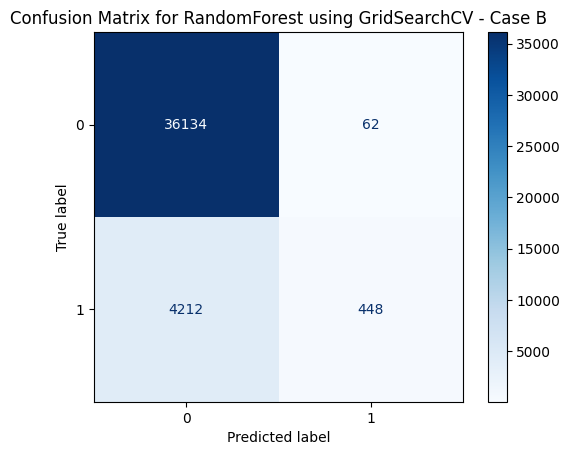

In [ ]:
cm = confusion_matrix(y_test_B, y_pred)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTree using GridSearchCV - Case B")
plt.show()

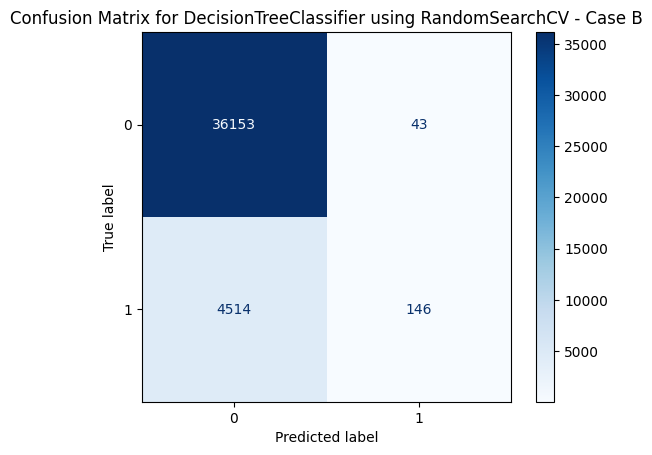

In [152]:
cm = confusion_matrix(y_test_B, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTreeClassifier using RandomSearchCV - Case B")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_B.shape[0]):
   temp_pred = best_tree.predict(test_B.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_B.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_B_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_B_GridSearchCV.csv


In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_B.shape[0]):
   temp_pred = best_random.predict(test_B.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_B.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_B_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_B_RandomSearchCV.csv


DTC Case C

In [155]:
time_DTC_start_C = time.time()
grid_search.fit(X_test_C, y_test_C)
time_DTC_end_C = time.time()

print("time taken to fit for condition C:", time_DTC_end_C - time_DTC_start_C)

Fitting 5 folds for each of 1155 candidates, totalling 5775 fits


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  30.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  30.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  36.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  34.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  26.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  25.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  31.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  32.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  33.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  11.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  11.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  16.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  15.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  16.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  15.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  15.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  14.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  14.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  16.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  16.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  16.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  15.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  15.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  16.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  17.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  17.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  17.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  18.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  17.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  17.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  17.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  19.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  18.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  18.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  17.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  14.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  14.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  15.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  15.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  16.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  14.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  14.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  14.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  12.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  12.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  13.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  14.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  16.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  16.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  16.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  18.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  17.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  17.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  17.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  16.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  15.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  15.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  15.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  15.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  17.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  20.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   4.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   4.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   4.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   4.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   4.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   4.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   4.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   4.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   4.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   4.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   4.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   4.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   4.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   4.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   4.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   4.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   4.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   4.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   4.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   4.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   4.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   4.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   4.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   4.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   4.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  21.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  20.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  21.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  22.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  22.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  22.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  22.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  22.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  22.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.9s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.9s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  26.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  27.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  27.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  27.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  25.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  25.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  36.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  35.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  37.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  23.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  29.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  27.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  27.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  28.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  28.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  25.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s



/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  55.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  54.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  54.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  54.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  54.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  54.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  54.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  55.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  45.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  44.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  45.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  45.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  46.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  45.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  45.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  46.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  46.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  50.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  50.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  52.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  43.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  44.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  42.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  41.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  41.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  41.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  38.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  27.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  33.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  33.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  34.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  38.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  13.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  13.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  12.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  29.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  32.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  11.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  12.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  12.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  14.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  10.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  10.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  31.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  33.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  25.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  16.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  16.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  15.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  12.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  12.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  12.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  11.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  11.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  11.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  11.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  12.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  10.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   9.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   9.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  13.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  13.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  13.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  12.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  13.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  43.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  43.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  42.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  43.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  28.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  28.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  28.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  27.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  32.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  12.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  10.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  10.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  12.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  11.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  11.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  11.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  43.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  44.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  44.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  42.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  42.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  36.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  40.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  40.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  36.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  35.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  40.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  39.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  36.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   7.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   7.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  28.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  27.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  27.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  27.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  25.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  24.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  25.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  23.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  24.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  24.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  24.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  24.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  24.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  24.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  23.5s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  23.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  22.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  22.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  23.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  22.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  22.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  22.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  23.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  13.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  13.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  14.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  13.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  13.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  11.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  10.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


time taken to fit for condition C: 10883.940690755844


In [156]:
time_DTC_start_C = time.time()
random_search.fit(X_test_C, y_test_C)
time_DTC_end_C = time.time()

print("time taken to fit for condition A using RandomSearchCV:", time_DTC_start_C - time_DTC_end_C)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   0.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min

In [157]:
# Best parameters and estimator
print("Best Parameters:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred = best_tree.predict(X_test_C)

# Calculate accuracy
accuracy = accuracy_score(y_test_C, y_pred)
print(f"Tuned Decision Tree Accuracy: {accuracy:.2f}")

Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 15}
Tuned Decision Tree Accuracy: 0.91


In [158]:
# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_C)
accuracy_random = accuracy_score(y_test_C, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

Best Parameters from RandomizedSearchCV: {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 5}
RandomizedSearchCV Accuracy: 0.89


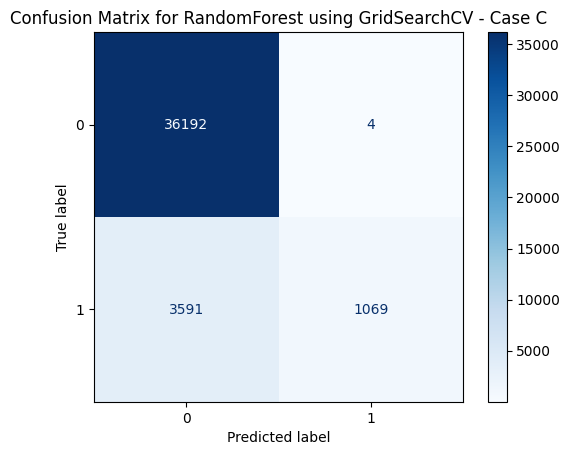

In [ ]:
cm = confusion_matrix(y_test_C, y_pred)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTree using GridSearchCV - Case C")
plt.show()

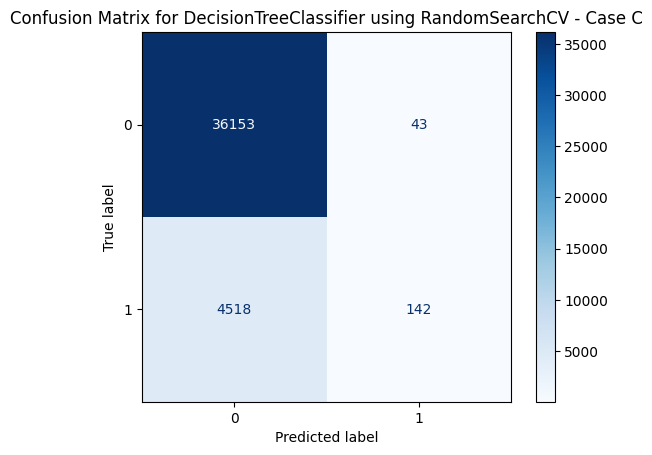

In [160]:
cm = confusion_matrix(y_test_C, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTreeClassifier using RandomSearchCV - Case C")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_C.shape[0]):
   temp_pred = best_tree.predict(test_C.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_C.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_C_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_C_GridSearchCV.csv


In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_C.shape[0]):
   temp_pred = best_random.predict(test_C.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_C.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_C_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_C_RandomSearchCV.csv


DTC Case D

In [163]:
time_DTC_start_D = time.time()
grid_search.fit(X_test_D, y_test_D)
time_DTC_end_D = time.time()

print("time taken to fit for condition D:", time_DTC_end_D - time_DTC_start_D)

Fitting 5 folds for each of 1155 candidates, totalling 5775 fits


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  21.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  22.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  22.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  22.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  22.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  23.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  24.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  25.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  24.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  24.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  25.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  25.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  25.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  27.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  27.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  27.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  25.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  25.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  25.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  25.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  24.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  24.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  24.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  24.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  22.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  23.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  23.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  23.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  23.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  24.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  23.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  24.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  23.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  21.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  22.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  22.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  22.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  22.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  22.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  22.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  22.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  22.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  22.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  22.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  22.2s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  21.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  22.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.5s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.4s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  10.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  10.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=   9.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  10.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  10.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  10.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=   9.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=   9.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=   9.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   9.7s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  10.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=   9.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=   9.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=   9.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=   9.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  10.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  10.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  10.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  10.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  10.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=   9.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=   9.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=   9.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  10.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  10.1s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=   9.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=   9.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=   9.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=   9.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  10.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   2.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   2.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   2.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   2.7s[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   2.6s

[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   2.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   2.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   2.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   2.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   2.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   2.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   2.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   3.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   2.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   2.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   2.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   3.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   3.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   3.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   2.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   2.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   2.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   2.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   2.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   3.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   3.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   2.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   2.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   2.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  18.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  18.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  18.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  18.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  18.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  17.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  18.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  19.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  18.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  18.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  18.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  18.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  17.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  17.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  18.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  18.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  18.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  18.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  18.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  18.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  19.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  18.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  17.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  17.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  17.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  17.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  17.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  18.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  18.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  18.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  18.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  18.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  17.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  17.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  17.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  17.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  17.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  17.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  17.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  17.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  18.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  18.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  18.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  19.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  19.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  19.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  18.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  19.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  18.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  18.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  18.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.0s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  25.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 5.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 5.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 5.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time= 5.1min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 5.1min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time= 5.1min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 5.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time= 5.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  49.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  50.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  50.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  49.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  49.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  50.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  50.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  51.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time= 1.2min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time= 1.2min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time= 1.2min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time= 1.2min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time= 5.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time= 5.8min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time= 5.8min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time= 5.8min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time= 5.8min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time= 5.8min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time= 5.8min
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time= 5.8min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   7.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.9s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   7.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.9s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  31.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  42.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  42.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  43.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  43.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  35.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  35.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  34.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  36.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  35.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  35.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  38.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  38.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  25.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  25.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  13.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  13.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  11.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  11.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  11.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  11.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  11.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  10.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  13.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  14.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  13.5s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  11.6s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  11.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  11.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  10.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  10.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  10.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  12.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  14.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  16.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  44.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  44.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  43.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  44.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  43.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  44.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  45.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  44.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  41.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  42.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  41.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  42.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  42.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  42.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  44.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  41.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  41.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  43.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  43.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  43.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  44.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.9s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.6s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  33.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.6s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.7s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.1s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  34.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  32.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  32.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  27.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  28.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.2s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   9.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  36.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  35.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  35.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  35.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  43.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  43.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  42.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  43.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  44.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  43.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  43.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  46.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  49.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  49.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  49.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  46.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  47.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  46.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  45.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  38.2s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  40.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  44.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  45.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  45.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  46.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  46.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  45.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  41.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  41.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  40.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  40.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  48.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  49.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  49.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  48.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  48.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  48.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  49.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  50.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  41.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  41.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  41.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  40.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  36.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  37.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  41.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  41.4s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  40.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  41.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  37.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  37.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  37.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  35.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  35.7s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  33.6s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  28.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.8s
[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.0s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.4s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.6s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.8s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.9s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.2s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.4s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.3s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s
[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  33.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  33.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  35.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.9s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.0s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.2s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  29.1s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.6s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  26.8s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.3s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  28.7s
[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.8s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.1s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.5s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.1s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.3s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   7.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.8s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.2s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.0s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


time taken to fit for condition D: 11401.580294370651


In [164]:
time_DTC_start_D = time.time()
random_search.fit(X_test_D, y_test_D)
time_DTC_end_D = time.time()

print("time taken to fit for condition A using RandomSearchCV:", time_DTC_end_D - time_DTC_start_D)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   0.1s
[CV

In [165]:
# Best parameters and estimator
print("Best Parameters:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred = best_tree.predict(X_test_D)

# Calculate accuracy
accuracy = accuracy_score(y_test_D, y_pred)
print(f"Tuned Decision Tree Accuracy: {accuracy:.2f}")

Best Parameters: {'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 2, 'min_samples_split': 10}
Tuned Decision Tree Accuracy: 0.91


In [166]:
# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_D)
accuracy_random = accuracy_score(y_test_D, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

Best Parameters from RandomizedSearchCV: {'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 5}
RandomizedSearchCV Accuracy: 0.89


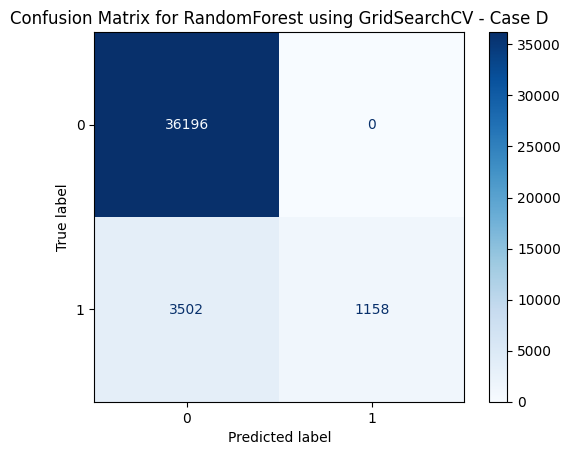

In [ ]:
cm = confusion_matrix(y_test_D, y_pred)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTree using GridSearchCV - Case D")
plt.show()

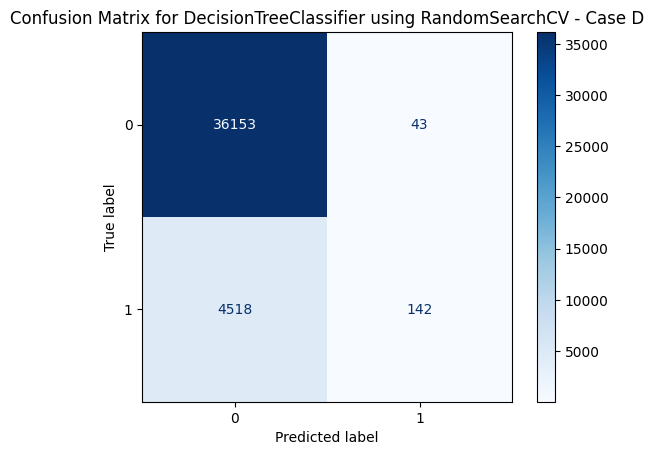

In [168]:
cm = confusion_matrix(y_test_D, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTreeClassifier using RandomSearchCV - Case D")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_D.shape[0]):
   temp_pred = best_tree.predict(test_D.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_D.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_D_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_D_GridSearchCV.csv


In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_D.shape[0]):
   temp_pred = best_random.predict(test_D.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_D.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_D_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_RF_D_RandomSearchCV.csv


DTC Case E

In [171]:
time_DTC_start_E = time.time()
grid_search.fit(X_test_E, y_test_E)
time_DTC_end_E = time.time()

print("time taken to fit for condition E:", time_DTC_end_E - time_DTC_start_E)

Fitting 5 folds for each of 1155 candidates, totalling 5775 fits


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time= 2.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time= 2.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time= 2.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time= 2.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time= 2.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time= 2.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time= 2.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2; total time= 2.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  51.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  49.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  49.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  51.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  50.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  50.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  50.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  51.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  47.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  46.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  46.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  46.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  47.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  46.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  47.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  47.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  46.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  45.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  45.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  45.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  45.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  46.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time= 1.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=30; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time= 1.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time= 1.1min
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=2; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  58.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  58.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  59.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  59.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  59.4s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=5; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  58.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  59.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time= 1.1min
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time= 1.1min
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=15; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  57.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  57.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  55.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  56.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  57.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  56.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  56.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  56.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  50.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  49.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  50.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  50.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  50.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  49.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  50.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  49.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=2; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time= 6.3min
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=5; total time= 6.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  49.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  49.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  48.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  49.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  49.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  49.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  50.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  49.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  52.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  50.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  51.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  51.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  50.3s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  50.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  50.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  51.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  59.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  59.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  58.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  58.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  58.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  59.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  58.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=25; total time= 1.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  48.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  48.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  48.6s
[CV] END max_depth=None, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  50.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  48.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  49.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  49.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  50.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=5; total time= 1.1min
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=10; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  59.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  59.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time= 1.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time= 1.0min
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=15; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time= 1.2min
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=20; total time= 1.3min
[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=25; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=8, min_samples_split=30; total time= 1.2min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=2; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 1.1min
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 1.1min
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 1.0min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=5; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time= 1.1min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  44.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  45.1s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  44.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  44.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  45.0s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  44.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  43.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  44.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  44.5s
[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  44.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  44.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  14.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  14.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  15.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  14.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  14.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  13.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  13.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  15.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  15.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  15.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  15.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  15.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  15.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  15.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  15.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  16.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  17.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  16.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  17.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  16.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  16.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  17.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  15.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  15.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  15.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  15.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  16.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  16.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  16.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  16.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  17.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  16.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  17.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  17.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  16.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  17.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  16.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  16.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  15.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  16.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  15.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  15.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  15.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  14.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  15.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  14.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  14.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  13.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  13.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  14.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  15.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  15.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  15.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  15.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  13.4s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  13.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  12.6s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  12.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  12.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  15.9s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  16.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  15.7s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  16.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  13.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  12.3s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  12.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  13.0s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  13.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  14.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  16.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  15.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  16.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  16.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  16.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  22.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  21.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  29.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  23.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  23.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  22.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  23.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  18.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  16.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  16.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  16.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  16.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  16.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  16.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  15.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  15.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  16.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  18.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  17.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  17.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  17.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  18.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  20.2s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  21.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  20.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  21.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  20.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  16.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  15.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  15.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  15.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  16.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  16.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  16.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  18.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  17.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  17.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  18.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  17.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  16.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  17.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  16.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  15.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  15.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  14.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  15.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  15.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  14.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  14.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  13.6s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  14.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  14.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  14.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  14.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  13.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  14.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  14.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  14.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  13.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  12.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  13.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  13.3s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.7s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  13.0s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  13.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  12.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  13.5s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  11.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  11.9s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=  11.8s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  12.1s
[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  19.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  20.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  19.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.4s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  19.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  20.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  19.5s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  19.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  19.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  19.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  21.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  21.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  22.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  22.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  21.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  23.8s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  23.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  23.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  23.6s
[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  22.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  21.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  20.2s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  19.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  18.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  20.3s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  19.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  18.9s
[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  18.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  18.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  18.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  20.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  19.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  19.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  19.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  20.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   5.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  19.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  20.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  19.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  20.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  20.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   5.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  20.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.0s
[CV] END max_depth=5, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  20.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.4s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   5.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   5.6s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   5.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   5.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   5.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   5.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   6.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   5.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   5.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   5.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   5.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.0s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.2s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.7s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.5s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.1s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.3s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   5.9s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s
[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   6.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   8.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   6.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   6.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   6.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   6.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.2s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   6.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   5.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   5.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   5.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   5.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.6s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.0s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.3s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.8s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.7s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.5s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.9s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s
[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  41.6s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  41.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  42.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  41.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  42.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  42.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  44.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  43.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  44.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  43.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  43.8s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  42.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  42.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  43.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  44.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  43.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  45.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  45.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  45.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  45.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  45.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  46.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  44.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  44.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  43.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  45.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  46.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  45.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  46.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  45.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  45.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  45.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  46.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  46.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  46.5s
[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  45.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  44.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  45.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  42.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  44.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  45.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  45.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  45.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  46.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  45.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  46.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  45.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  45.3s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  42.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  43.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  44.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  46.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  43.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  44.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  42.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  42.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  38.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  38.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  37.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  38.4s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  38.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  37.7s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  36.2s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  37.1s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  36.9s
[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  39.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  12.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  11.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.3s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  14.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  14.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.9s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time= 1.8min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time= 1.9min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  15.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  14.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  12.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   5.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   5.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.1s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   6.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.5s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.2s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.7s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.0s
[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   7.4s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   5.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   5.8s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   5.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.3s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   6.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.0s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   5.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.2s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.5s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   5.1s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   4.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   4.9s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   4.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   5.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   4.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   4.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   4.7s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   4.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   4.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   4.6s
[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   4.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   4.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   4.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   4.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   4.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  25.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  25.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  26.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  29.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  28.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  28.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.7s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  32.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  31.0s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  30.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  29.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.8s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  32.2s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  32.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.9s
[CV] END max_depth=15, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.1s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.4s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.3s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.5s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.6s
[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   7.8s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.9s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.0s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.4s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.7s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.2s
[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.1s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.6s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.4s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.8s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  37.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  36.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  35.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.4s
[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  35.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  40.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  37.2s
[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  35.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.5s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.0s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  33.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  34.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  41.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.3s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.1s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.7s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.8s
[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.8s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.1s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.2s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.4s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.4s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.8s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.3s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.2s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.9s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.1s
[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.2s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  40.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  37.3s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  35.9s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  28.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  27.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.4s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  26.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.0s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  24.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  23.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.1s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  24.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  24.5s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  24.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  25.7s
[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  26.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  25.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  26.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.5s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time= 1.3min
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time= 1.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time= 1.3min
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time= 1.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time= 1.3min
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time= 1.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time= 1.3min
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time= 1.3min


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   5.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   6.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.3s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   7.6s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.0s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.4s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.8s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   6.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   8.6s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  12.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.4s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.0s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   8.2s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.3s
[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  36.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.3s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  35.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.7s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  39.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  39.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  38.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  42.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  42.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  41.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  41.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  42.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  41.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  42.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  43.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  44.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  45.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  39.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.8s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  36.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  37.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  37.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  38.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  35.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  35.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.4s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.0s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.5s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.6s
[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.9s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  31.2s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.1s
[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  29.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  11.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  12.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  13.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  12.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  12.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  11.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  11.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  13.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  12.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  11.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.4s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  10.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.8s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.2s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.1s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.0s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.3s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.9s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s
[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  13.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  13.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  12.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  13.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  13.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.0s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.3s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.6s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.1s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  11.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.9s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=   9.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.7s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=   9.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.2s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.8s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   8.5s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.4s
[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=30, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  36.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  35.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  36.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  39.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  35.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  41.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  41.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  36.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  37.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.6s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  34.9s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.5s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  35.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  31.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.7s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  30.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.8s
[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  28.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  31.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  30.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  29.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  29.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  30.4s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  31.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  34.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  34.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  34.1s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.0s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.3s
[CV] END max_depth=35, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  30.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  10.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.1s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=  10.0s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.8s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.2s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  11.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.4s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.5s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   8.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  11.1s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.5s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  10.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  12.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  12.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  12.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  12.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  12.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  12.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  12.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.4s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.6s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.2s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  42.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  42.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  42.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  40.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  40.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  41.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  44.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  41.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  42.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  40.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  41.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  41.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  42.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  45.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  45.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  45.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  46.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  44.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  45.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  44.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  44.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  42.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  43.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  40.7s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  40.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  39.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  39.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  39.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  40.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  39.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  38.2s
[CV] END max_depth=40, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  39.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  40.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  41.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  42.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  42.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  43.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  41.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  41.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=10; total time=  42.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  36.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  35.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  36.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  35.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=20; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  32.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  32.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=25; total time=  33.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=4, min_samples_split=30; total time=  34.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.5s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=2; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.8s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=5; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  34.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.1s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  31.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=15; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=20; total time=  33.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=25; total time=  33.9s
[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  33.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  34.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=8, min_samples_split=30; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  33.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  33.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=2; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  33.0s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  32.4s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  32.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  32.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=10; total time=  33.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  33.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=15; total time=  34.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.6s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=20; total time=  32.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  32.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  31.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=25; total time=  27.3s
[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=None, min_samples_leaf=16, min_samples_split=30; total time=  27.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=2; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=25; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=1, min_samples_split=30; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=10; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   9.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=2; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=5; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=10; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=15; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   8.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=5; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.8s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=10; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=25; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=8, min_samples_split=30; total time=   9.2s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.5s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.0s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=5; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=10; total time=   7.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.1s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=15; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.7s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=20; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=25; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.9s
[CV] END max_depth=40, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=2; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=5; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  11.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=20; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=25; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=1, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.6s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=2; total time=  10.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=   9.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.3s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=30; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  12.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=2; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  11.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=5; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=10; total time=  11.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.9s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=15; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=20; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=25; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=4, min_samples_split=30; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  11.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=2; total time=  12.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  11.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=5; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  10.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=10; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=15; total time=  10.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=25; total time=  10.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.8s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.0s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=5; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=10; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.5s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.1s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=15; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=20; total time=   9.4s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.2s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=25; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.7s
[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=16, min_samples_split=30; total time=   9.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=2; total time=  39.5s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=5; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=10; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=15; total time=  39.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  38.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  39.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=20; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  40.1s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=25; total time=  41.3s
[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  40.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=1, min_samples_split=30; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=2; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.9s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  37.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  39.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  39.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  38.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=15; total time=  40.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  39.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=20; total time=  36.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  36.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=25; total time=  40.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  40.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  41.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  41.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  43.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=2, min_samples_split=30; total time=  42.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  42.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  43.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  45.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  45.0s
[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  44.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=None, min_samples_leaf=4, min_samples_split=5; total time=  43.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


KeyboardInterrupt: 

In [ ]:
time_DTC_start_E = time.time()
random_search.fit(X_test_E, y_test_E)
time_DTC_end_E = time.time()

print("time taken to fit for condition E using RandomSearchCV:", time_DTC_end_E - time_DTC_start_E)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConvers

[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.2s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=1, min_samples_split=10; total time=  10.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.8s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s
[CV] END max_depth=None, max_features=sqrt, min_samples_leaf=4, min_samples_split=25; total time=   9.7s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   8.9s
[CV] END max_depth=50, max_features=sqrt, min_samples_leaf=8, min_samples_split=15; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.3s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=log2, min_samples_leaf=8, min_samples_split=20; total time=   9.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.6s
[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=   9.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=30; total time=  10.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  34.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.4s
[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  38.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=None, min_samples_leaf=8, min_samples_split=10; total time=  39.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.8s
[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  12.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=45, max_features=sqrt, min_samples_leaf=1, min_samples_split=10; total time=  11.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  11.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  38.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=None, min_samples_leaf=16, min_samples_split=5; total time=  38.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  14.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  34.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=2; total time=  35.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  13.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  13.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=40, max_features=log2, min_samples_leaf=2, min_samples_split=15; total time=  13.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  12.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  11.2s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.9s
[CV] END max_depth=25, max_features=sqrt, min_samples_leaf=4, min_samples_split=20; total time=  10.7s
[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   9.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=20, max_features=sqrt, min_samples_leaf=16, min_samples_split=30; total time=   8.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  13.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  13.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  13.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  13.3s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=5, max_features=None, min_samples_leaf=2, min_samples_split=5; total time=  13.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.9s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.7s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.8s
[CV] END max_depth=None, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  38.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  34.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=35, max_features=None, min_samples_leaf=4, min_samples_split=15; total time=  35.5s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  36.4s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  36.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.4s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.7s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=2, min_samples_split=20; total time=   8.9s
[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.6s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.2s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=15, max_features=log2, min_samples_leaf=8, min_samples_split=30; total time=   8.1s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.6s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.8s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   8.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  37.0s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=50, max_features=log2, min_samples_leaf=16, min_samples_split=2; total time=   7.7s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.9s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.8s
[CV] END max_depth=25, max_features=None, min_samples_leaf=2, min_samples_split=10; total time=  35.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   9.0s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   8.8s
[CV] END max_depth=35, max_features=log2, min_samples_leaf=2, min_samples_split=5; total time=   7.9s


/Users/soardr/Downloads/QValue AIM511/.venv/lib/python3.11/site-packages/sklearn/base.py:1473: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


time taken to fit for condition E using RandomSearchCV: 243.6952519416809


In [ ]:
# Best parameters and estimator
print("Best Parameters:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred = best_tree.predict(X_test_E)

# Calculate accuracy
accuracy = accuracy_score(y_test_E, y_pred)
print(f"Tuned Decision Tree Accuracy: {accuracy:.2f}")

Best Parameters: {'max_depth': 5, 'max_features': None, 'min_samples_leaf': 1, 'min_samples_split': 2}
Tuned Decision Tree Accuracy: 0.89


In [ ]:
# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_E)
accuracy_random = accuracy_score(y_test_E, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

Best Parameters from RandomizedSearchCV: {'min_samples_split': 5, 'min_samples_leaf': 16, 'max_features': None, 'max_depth': 15}
RandomizedSearchCV Accuracy: 0.90


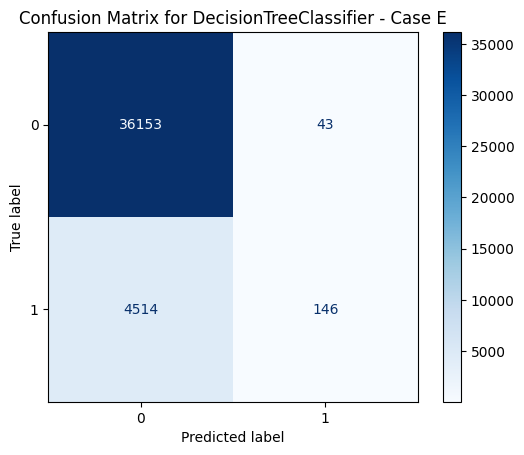

In [ ]:
cm = confusion_matrix(y_test_E, y_pred)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTree using GridSearchCV - Case E")
plt.show()

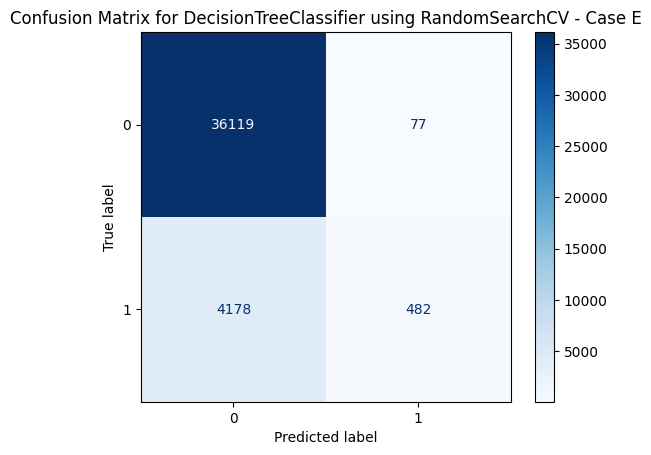

In [ ]:
cm = confusion_matrix(y_test_E, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for DecisionTreeClassifier using RandomSearchCV - Case E")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_E.shape[0]):
   temp_pred = best_tree.predict(test_E.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_E.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_E_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_DTC_E_GridSearchCV.csv


In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_E.shape[0]):
   temp_pred = best_random.predict(test_E.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_E.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_DTC_E_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

Data has been written to output_DTC_E_RandomSearchCV.csv


**Model Training for RandomForestClassifier**

In [ ]:
grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2, scoring='accuracy')
random_search = RandomizedSearchCV(estimator=rf, param_distributions=param_grid, n_iter=20, cv=5, n_jobs=-1,
                                   verbose=2, random_state=7, scoring='accuracy')

RF Case A

In [ ]:
time_DTC_start_A = time.time()
grid_search.fit(X_test_A, y_test_A)
time_DTC_end_A = time.time()

print("time taken to fit for condition A using GridSearch:", time_DTC_end_A - time_DTC_start_A)

time_DTC_start_A = time.time()
random_search.fit(X_test_A, y_test_A)
time_DTC_end_A = time.time()

print("time taken to fit for condition A using RandomSearchCV:", time_DTC_end_A - time_DTC_start_A)

In [ ]:
# Best parameters and estimator
print("Best Parameters from GridSearchCV:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred_grid = best_tree.predict(X_test_A)

# Calculate accuracy
accuracy = accuracy_score(y_test_A, y_pred_grid)
print(f"Tuned Random Forest Accuracy: {accuracy:.2f}")

# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_A)
accuracy_random = accuracy_score(y_test_A, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

In [ ]:
cm = confusion_matrix(y_test_A, y_pred_grid)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using GridSearchCV - Case A")
plt.show()

In [ ]:
cm = confusion_matrix(y_test_A, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using RandomSearchCV - Case A")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_A.shape[0]):
   temp_pred = best_tree.predict(test_A.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_A.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_A_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

data = [["LoanID", "Default"]]
for i in range(test_A.shape[0]):
   temp_pred = best_random.predict(test_A.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_A.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_A_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

RF Case B

In [ ]:
time_DTC_start_B = time.time()
grid_search.fit(X_test_B, y_test_B)
time_DTC_end_B = time.time()

print("time taken to fit for condition B using GridSearch:", time_DTC_end_B - time_DTC_start_B)

time_DTC_start_B = time.time()
random_search.fit(X_test_B, y_test_B)
time_DTC_end_B = time.time()

print("time taken to fit for condition B using RandomSearchCV:", time_DTC_end_B - time_DTC_start_B)

In [ ]:
# Best parameters and estimator
print("Best Parameters from GridSearchCV:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred_grid = best_tree.predict(X_test_B)

# Calculate accuracy
accuracy = accuracy_score(y_test_B, y_pred_grid)
print(f"Tuned Random Forest Accuracy: {accuracy:.2f}")

# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_B)
accuracy_random = accuracy_score(y_test_B, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

In [ ]:
cm = confusion_matrix(y_test_B, y_pred_grid)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using GridSearchCV - Case B")
plt.show()

In [ ]:
cm = confusion_matrix(y_test_B, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using RandomSearchCV - Case B")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_B.shape[0]):
   temp_pred = best_tree.predict(test_B.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_B.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_B_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

data = [["LoanID", "Default"]]
for i in range(test_B.shape[0]):
   temp_pred = best_random.predict(test_B.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_B.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_B_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

RF Case C

In [ ]:
time_DTC_start_C = time.time()
grid_search.fit(X_test_C, y_test_C)
time_DTC_end_C = time.time()

print("time taken to fit for condition C using GridSearch:", time_DTC_end_C - time_DTC_start_C)

time_DTC_start_C = time.time()
random_search.fit(X_test_C, y_test_C)
time_DTC_end_C = time.time()

print("time taken to fit for condition C using RandomSearchCV:", time_DTC_end_C - time_DTC_start_C)

In [ ]:
# Best parameters and estimator
print("Best Parameters from GridSearchCV:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred_grid = best_tree.predict(X_test_C)

# Calculate accuracy
accuracy = accuracy_score(y_test_C, y_pred_grid)
print(f"Tuned Random Forest Accuracy: {accuracy:.2f}")

# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_C)
accuracy_random = accuracy_score(y_test_C, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

In [ ]:
cm = confusion_matrix(y_test_C, y_pred_grid)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using GridSearchCV - Case C")
plt.show()

In [ ]:
cm = confusion_matrix(y_test_C, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using RandomSearchCV - Case C")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_C.shape[0]):
   temp_pred = best_tree.predict(test_C.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_C.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_C_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

data = [["LoanID", "Default"]]
for i in range(test_C.shape[0]):
   temp_pred = best_random.predict(test_C.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_C.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_C_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

RF Case D

In [ ]:
time_DTC_start_D = time.time()
grid_search.fit(X_test_D, y_test_D)
time_DTC_end_D = time.time()

print("time taken to fit for condition D using GridSearch:", time_DTC_end_D - time_DTC_start_D)

time_DTC_start_D = time.time()
random_search.fit(X_test_C, y_test_C)
time_DTC_end_D = time.time()

print("time taken to fit for condition D using RandomSearchCV:", time_DTC_end_D - time_DTC_start_D)

In [ ]:
# Best parameters and estimator
print("Best Parameters from GridSearchCV:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred_grid = best_tree.predict(X_test_D)

# Calculate accuracy
accuracy = accuracy_score(y_test_D, y_pred_grid)
print(f"Tuned Random Forest Accuracy: {accuracy:.2f}")

# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_D)
accuracy_random = accuracy_score(y_test_D, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

In [ ]:
cm = confusion_matrix(y_test_D, y_pred_grid)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using GridSearchCV - Case D")
plt.show()

In [ ]:
cm = confusion_matrix(y_test_D, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using RandomSearchCV - Case D")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_D.shape[0]):
   temp_pred = best_tree.predict(test_D.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_D.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_D_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

data = [["LoanID", "Default"]]
for i in range(test_D.shape[0]):
   temp_pred = best_random.predict(test_D.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_D.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_D_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

RF Case E

In [ ]:
time_DTC_start_E = time.time()
grid_search.fit(X_test_E, y_test_E)
time_DTC_end_E = time.time()

print("time taken to fit for condition E using GridSearch:", time_DTC_end_E - time_DTC_start_E)

time_DTC_start_E = time.time()
random_search.fit(X_test_E, y_test_E)
time_DTC_end_E = time.time()

print("time taken to fit for condition E using RandomSearchCV:", time_DTC_end_E - time_DTC_start_E)

In [ ]:
# Best parameters and estimator
print("Best Parameters from GridSearchCV:", grid_search.best_params_)
best_tree = grid_search.best_estimator_

# Make predictions on the test set with the best model
y_pred_grid = best_tree.predict(X_test_E)

# Calculate accuracy
accuracy = accuracy_score(y_test_E, y_pred_grid)
print(f"Tuned Random Forest Accuracy: {accuracy:.2f}")

# Get the best parameters from RandomizedSearchCV
print("Best Parameters from RandomizedSearchCV:", random_search.best_params_)
best_random = random_search.best_estimator_

# Evaluate the best model from RandomizedSearchCV
y_pred_random = best_random.predict(X_test_E)
accuracy_random = accuracy_score(y_test_E, y_pred_random)
print(f"RandomizedSearchCV Accuracy: {accuracy_random:.2f}")

In [ ]:
cm = confusion_matrix(y_test_E, y_pred_grid)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using GridSearchCV - Case E")
plt.show()

In [ ]:
cm = confusion_matrix(y_test_E, y_pred_random)

# Plot the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix for RandomForest using RandomSearchCV - Case E")
plt.show()

In [ ]:
data = [["LoanID", "Default"]]
for i in range(test_E.shape[0]):
   temp_pred = best_tree.predict(test_E.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_E.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_E_GridSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")

data = [["LoanID", "Default"]]
for i in range(test_E.shape[0]):
   temp_pred = best_random.predict(test_E.iloc[i:i+1, 1:])[0]
   temp_arr = [str(test_E.iloc[i, 0]), str(temp_pred)]
   data.append(temp_arr)

filename = "output_RF_E_RandomSearchCV.csv"

# Write data to CSV
with open(filename, mode="w", newline="") as file:
    writer = csv.writer(file)
    writer.writerows(data)

print(f"Data has been written to {filename}")